* [1.Préparation des données](#pd)
* [2.Prétraitement d'une image](#pi)
* [3.Extraction des features avec SIFT](#sift)
* [4.Extraction des features avec Transfer learning](#tl)


In [1]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

# Traitement images
# Traitement images
import PIL
from PIL import Image, ImageOps, ImageFilter
import cv2
from scipy.ndimage import gaussian_filter


from tensorflow.keras.preprocessing import image
import pickle
#cluster
from sklearn import manifold, decomposition
from sklearn import cluster, metrics

from scipy.spatial import distance

import os

# 1.Préparation des données<a class="anchor" id="pd"></a>

In [2]:
path = 'Flipkart/' # à adapter = répertoire de stockage du dataset
data= pd.read_csv("data_product.csv")
#data

In [4]:
data['image_path'] = data['image'].apply(lambda x:"Flipkart/Images/" +str(x))


In [188]:
df=data[['description','image','image_path','main_category']]
df.head()

,description,image,image_path,main_category
0,Key Features of Elegance Polyester Multicolor ...,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Flipkart/Images/55b85ea15a1536d46b7190ad6fff8c...,Home Furnishing
1,Specifications of Sathiyas Cotton Bath Towel (...,7b72c92c2f6c40268628ec5f14c6d590.jpg,Flipkart/Images/7b72c92c2f6c40268628ec5f14c6d5...,Baby Care
2,Key Features of Eurospa Cotton Terry Face Towe...,64d5d4a258243731dc7bbb1eef49ad74.jpg,Flipkart/Images/64d5d4a258243731dc7bbb1eef49ad...,Baby Care
3,Key Features of SANTOSH ROYAL FASHION Cotton P...,d4684dcdc759dd9cdf41504698d737d8.jpg,Flipkart/Images/d4684dcdc759dd9cdf41504698d737...,Home Furnishing
4,Key Features of Jaipur Print Cotton Floral Kin...,6325b6870c54cd47be6ebfbffa620ec7.jpg,Flipkart/Images/6325b6870c54cd47be6ebfbffa620e...,Home Furnishing


# 2. Prétraitement d'une image <a class="anchor" id="pi"></a>

In [7]:
## fonctions
def afficher_image_histopixel(image, titre):
    '''
    Afficher côte à côte l'image et l'histogramme de répartiton des pixels.
    Parameters
    ----------
    image : image à afficher, obligatoire.
    Returns
    -------
    None.
    '''
    plt.figure(figsize=(40, 10))
    plt.subplot(131)
    plt.title(titre, fontsize=30)
    plt.imshow(image, cmap='gray')
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(132)
    plt.title('Histogramme de répartition des pixels', fontsize=30)
    hist, bins = np.histogram(np.array(image).flatten(), bins=256)
    plt.bar(range(len(hist[0:255])), hist[0:255])
    plt.xlabel('Niveau de gris', fontsize=30)
    plt.ylabel('Nombre de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.subplot(133)
    plt.title('Histogramme cumulé des pixels', fontsize=30)
    plt.hist(np.array(image).flatten(), bins=range(256), cumulative=True)
    plt.xlabel('Niveau de gris', fontsize=24)
    plt.ylabel('Fréquence cumulée de pixels', fontsize=30)
    plt.xticks(fontsize=30)
    plt.yticks(fontsize=30)

    plt.show()
    
    

def preprocess_image(image):
    '''
     le pré-traitement suivant sera appliqué sur toutes les images :
    - Correction de l'exposition (étirement d'histogramme) avec PILS
      (autocontrast).
    - Correction du contraste (égalisation d'histogramme) avec OpenCV (CLAHE
      (Contrast Limited Adaptive Histogram Equalization).
    - Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV.
    - Conversion en niveau de gris de l'image (ORB, SIFT...).
    - Réduction de dimension avec OpenCV (resize et interpolation INTER_AREA).
    Parameters
    ----------
    image : image localisée dans un répertoire, obligatoire.
    
    Returns
    -------
    None
    '''
    path_out='Flipkart/Images_process/'
    # Variables locales
    dim = (224, 224)

    # Nom de l'image
    file_dir = os.path.split(image)

    # Chargement de l'image originale
    img = Image.open(image)

    # Correction de l'exposition PILS (étirement de l'histogramme)
    img = ImageOps.autocontrast(img, 1)

    # Conversion en niveau de gris de l'image
    img = cv2.cvtColor(np.array(img), cv2.COLOR_BGR2GRAY)
    # Correction du contraste OpenCV CLAHE (égalisation de l'histogramme)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
    img = clahe.apply(img)

    # Réduction du bruit avec l'algorithme Non-local Means Denoising d'OpenCV
    img = cv2.fastNlMeansDenoising(img, None, 5, 7, 21)

    # Redimensionnement en 224 * 224
    img = cv2.resize(np.array(img), dim, interpolation=cv2.INTER_AREA)

    # Sauvegarde de l'image dans le répertoire Flipkart/Images_process/
    cv2.imwrite(path + file_dir[1], img)

    return (path + file_dir[1])

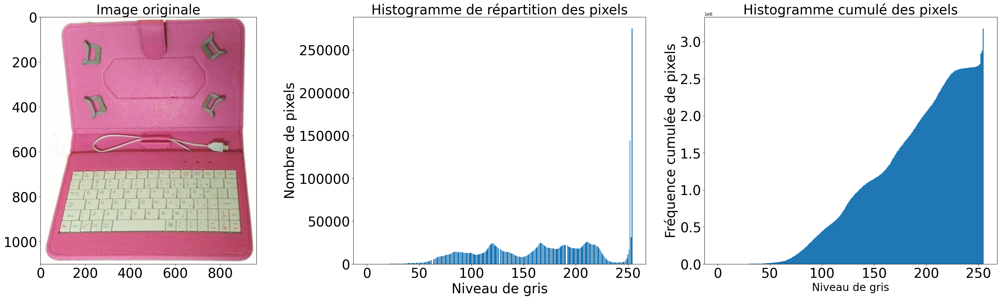

In [105]:
# Chargement de l'image originale comme matrice de pixels
img_orig = Image.open('Flipkart/Images/00e966a5049a262cfc72e6bbf68b80e7.jpg')
afficher_image_histopixel(img_orig, 'Image originale')

<b>Correction de l'exposition( étirement de l'histogramme)
- Corriger de la luminosité (ou exposition) de l'image.
- Image sous-exposée ==> histogramme concentré à droite vers les niveaux de gris faible (255 = blanc).
- Image sur-exposée ==> histogramme concentré à gauche vers les niveaux de gris fort (0 = noir).

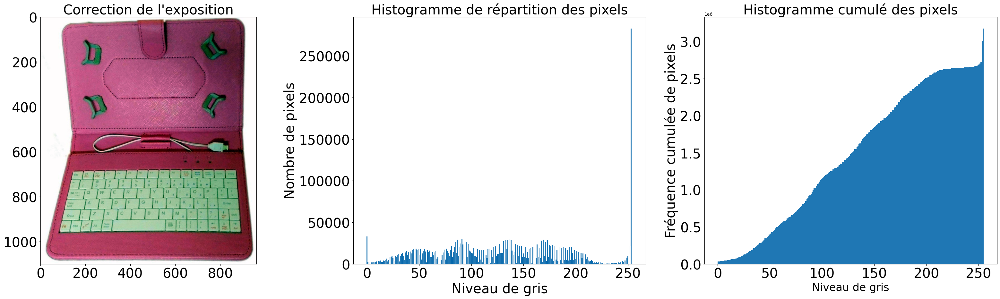

In [106]:
# Correction de l'exposition PILS
img_expo = ImageOps.autocontrast(img_orig, 1)
afficher_image_histopixel(img_expo,'Correction de l\'exposition')

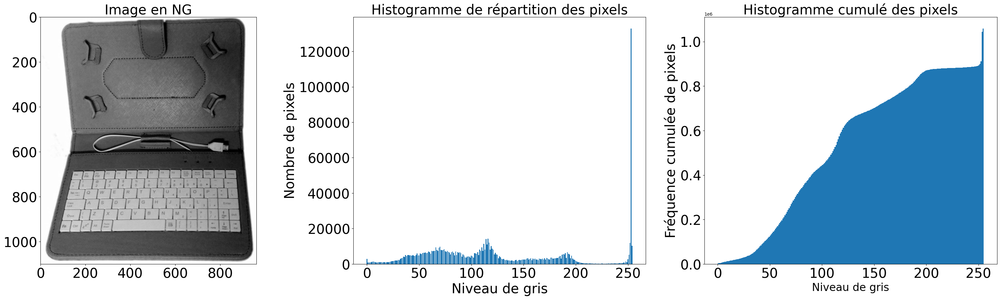

In [215]:
imgNg = cv2.cvtColor(np.array(img_expo), cv2.COLOR_BGR2GRAY)
afficher_image_histopixel(imgNg,'Image en NG')

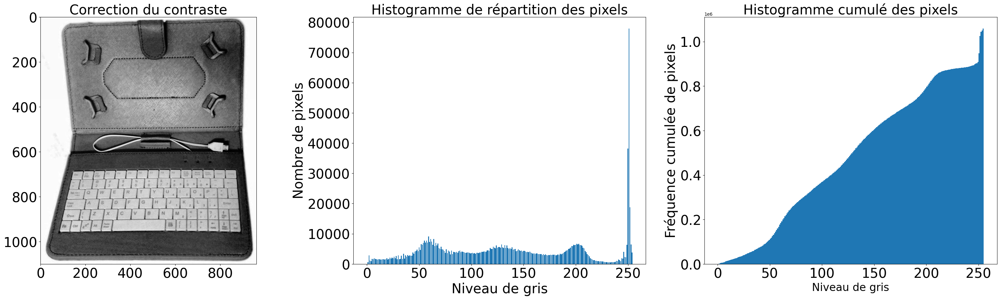

In [217]:
# Correction du contraste OpenCV CLAHE (égalisation de l'histogramme)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(3, 3))
imgco = clahe.apply(imgNg)
afficher_image_histopixel(imgco,' Correction du contraste ')

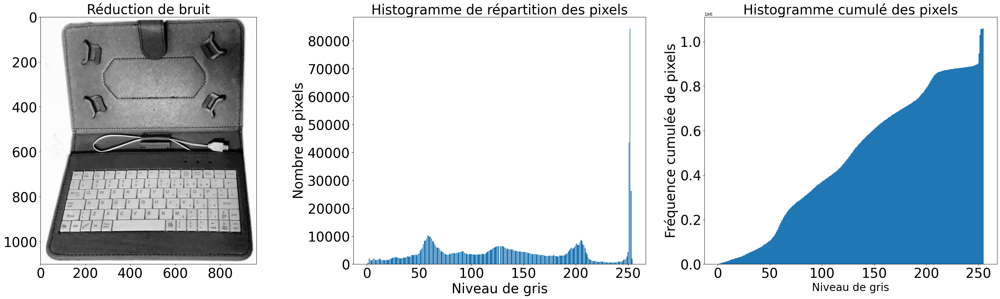

In [219]:
imgden = cv2.fastNlMeansDenoising(imgco, None, 5, 7, 21)
afficher_image_histopixel(imgden,' Réduction de bruit ')

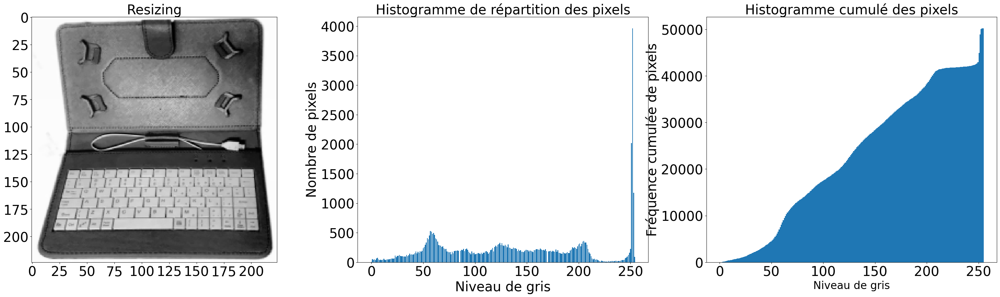

In [221]:
imgresiz = cv2.resize(np.array(imgden), (224,224), interpolation=cv2.INTER_AREA)
afficher_image_histopixel(imgresiz,' Resizing ')

In [115]:
# Pré-traitement de toutes les images
df['image_proces'] = \
    df['image_path'].apply(preprocess_image)

C:\Users\imen2\anaconda3\envs\oc_env\lib\site-packages\PIL\Image.py:3035: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


# 3.Extraction des features avec SIFT <a class="anchor" id="sift"></a>

**Etape1:Chargement des images prétraitées**

In [8]:
def charger_image_repertoire(repertoire):
    # Chargement des images pré-traitées
    images = {}
    for filename in os.listdir(repertoire):
        path = repertoire + "/" + filename
        img = cv2.imread(path, 0)
        images[filename] = img
    return images

In [9]:
# Chargement des images pré-traitées dans le dictionnaire images
dico_images = charger_image_repertoire('Flipkart/Images_process/')
print(f'{len(dico_images)} images chargées')

1050 images chargées


**Etape2: Extraction des features_visual words**

In [10]:
def sift_extract_features1(images):
    '''
    Extraire les descripteurs et keypoints(feature) avec SIFT.
    Parameters
    ----------
    images : les images dont on veut extraire les descripteurs et centres
             d'intérêt, obligatoire.
    Returns
    -------
    list des descripteurs et des vecteurs SIFT.
    '''
    sift_vectors = {}
    descriptor_list = []
    
    #sift = cv2.xfeatures2d.SIFT_create() 
    #The xfeatures2d don't belong to cv2 we replace it with cv2.SIFT_create()
    sift=cv2.SIFT_create()
    for key, value in images.items():
        features = []
        #image8bit = cv2.normalize(value, None, 0, 255, cv2.NORM_MINMAX).astype('uint8')
        
        #value = cv2.cvtColor(value, cv2.COLOR_BGR2GRAY)
        try:
            kp, des = sift.detectAndCompute(value, None)
        except :
            print('key:',key)
            print('value:',value)
        descriptor_list.extend(des)
        # in case no descriptor
        des = [np.zeros((128,))] if des is None else des
        features.append(des)
        sift_vectors[key] = features
    return [descriptor_list, sift_vectors]


In [11]:
sifts = sift_extract_features1(dico_images)


In [12]:
# Liste des descripteurs = tous les 'visual words' de toutes les images
sift_list_descripteurs = sifts[0]
len(sift_list_descripteurs)

334132

In [13]:
# Liste des vecteurs(features) par image (dictionnaires clé=nom_image, vecteur)
sift_all_bovw_features = sifts[1]
len(sift_all_bovw_features)

1050

In [181]:
# Sauvegarde des descripteurs SIFT
with open('sauvegarde/sift_list_descripteurs.pickle', 'wb') as f:
    pickle.dump(sift_list_descripteurs, f, pickle.HIGHEST_PROTOCOL)
# Sauvegarde des vecteurs (features) par images SIFT
with open('sauvegarde/sift_all_bovw_features.pickle', 'wb') as f:
    pickle.dump(sift_all_bovw_features, f, pickle.HIGHEST_PROTOCOL)

**Etape3:Trouver les Bags of Visual Words (BOVW )**

-  il suffit d'appliquer un algorithme de clustering aux descripteurs de features construits à l'étape 2, comme le k-means. 
- Les visual words correspondent alors aux centres des clusters trouvés.

In [14]:
# Constitution de bag of visual words
sift_kmeans = cluster.KMeans(n_clusters=1000, n_init=10)
sift_kmeans.fit(sift_list_descripteurs)
sift_visual_words = sift_kmeans.cluster_centers_

KeyboardInterrupt: 

Exception ignored in: 'sklearn.cluster._k_means_common._relocate_empty_clusters_dense'
Traceback (most recent call last):
  File "<__array_function__ internals>", line 177, in where
KeyboardInterrupt: 


In [15]:
# Sauvegarde du modèle KMeans Sift
with open('sauvegarde/sift_kmeans.pickle', 'wb') as f:
    pickle.dump(sift_kmeans, f, pickle.HIGHEST_PROTOCOL)
# Sauvegarde des VW SIFT
with open('sauvegarde/sift_visual_words.pickle', 'wb') as f:
    pickle.dump(sift_visual_words, f, pickle.HIGHEST_PROTOCOL)

**ÉTAPE 4 - Construction de l'histogramme pour chaque image** 
- Pour chaque image, on crée un histogramme qui indique la fréquence d'apparition de chaque visual word dans l'image :

In [16]:

def find_index(image, center):
    '''
    Find the index of the closest central point to the each sift descriptor.
    Paramètres: 
     image: sif descriptor 
     center:array of central points in k means
     Returns:
    the index of the closest central point.
    '''
    count = 0
    ind = 0
    for i in range(len(center)):
        if(i == 0):
            count = distance.euclidean(image, center[i])
            #count = L1_dist(image, center[i])
        else:
            dist = distance.euclidean(image, center[i])
            #dist = L1_dist(image, center[i])
            if(dist < count):
                ind = i
                count = dist
    return ind
def image_class(all_bovw, centers):
    dict_feature = {}
    for key, value in all_bovw.items():
        # display(key)
        category = []
        for img in value:
            # display(img)
            histogram = np.zeros(len(centers))
            for each_feature in img:
                ind = find_index(each_feature, centers)
                histogram[ind] += 1
            category.append(histogram)
        dict_feature[key] = category
    return dict_feature

In [18]:
sift_bovw =image_class(sift_all_bovw_features,sift_visual_words)

In [194]:
# Sauvegarde des BOVW SIFT
with open('sauvegarde/sift_bovw.pickle', 'wb') as f:
    pickle.dump(sift_bovw, f, pickle.HIGHEST_PROTOCOL)

In [21]:
sift_bovw

{'009099b1f6e1e8f893ec29a7023153c4.jpg': [array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  1.,  0.,  0.,
          1.,  0.,  0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,
          1.,  0.,  0.,  1.,  0.,  1.,  0.,  0.,  1.,  0.,  4.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,
          0.,  0.,  0.,  0.,  1., 10.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  2.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
          0.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,
          1.,  0.,  0.,  0.,  0.,  1.,  6.,  0.,  0.,  1.,  0.,  0.,  1.,
          0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  0.,  5.,  0.,  0.,  0.,
          1.,  1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,
          0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  2.,
          0.,  1.,  0.,  0.,  0.,  1.,  2.,  0.,  0.,  0.,  0.,  1.,  0.

In [185]:
with open('sauvegarde/sift_bovw.pickle', 'rb') as f:
    sift_bovw = pickle.load(f)

In [186]:
def constituer_dataframe_vectors(dataframe, variable):
    '''
    Transformer les np.array des histogrammes en autant de colonnes pour
    être utilisable par TSNE et le clustering.
    Parameters
    ----------
    dataframe : dataframe des histogrammes des images.
    variable : nom de la variable contenant les histogrammes à extraire.
    Returns
    -------
    dataframe_vecteurs : le dataframe avec chacune des BOVW de chaque umage
    dans une colonne.
    '''
    vectors = np.column_stack(dataframe[variable].values.tolist())
    dataframe_vecteurs = pd.DataFrame(vectors).T

    return dataframe_vecteurs

In [189]:
# Dataframe de sauvegarde des BOVW SIFT
df_sift_bovw = pd.DataFrame({'image': sift_bovw.keys(),
                             'sift_bovw': sift_bovw.values()})
# Ajout des BOVW en np.array d'une liste
df_sift_bovw['Histo'] = [row[0] for row in df_sift_bovw['sift_bovw']]
# Ajout de la catégorie
df_sift_bovw = df_sift_bovw.merge(df[['image', 'image_path',
                                        'main_category']], how='left',
                                  on='image')
# Constituer le dataframe de vecteurs de BOVW
df_sift_vectors =constituer_dataframe_vectors(df_sift_bovw, 'Histo')

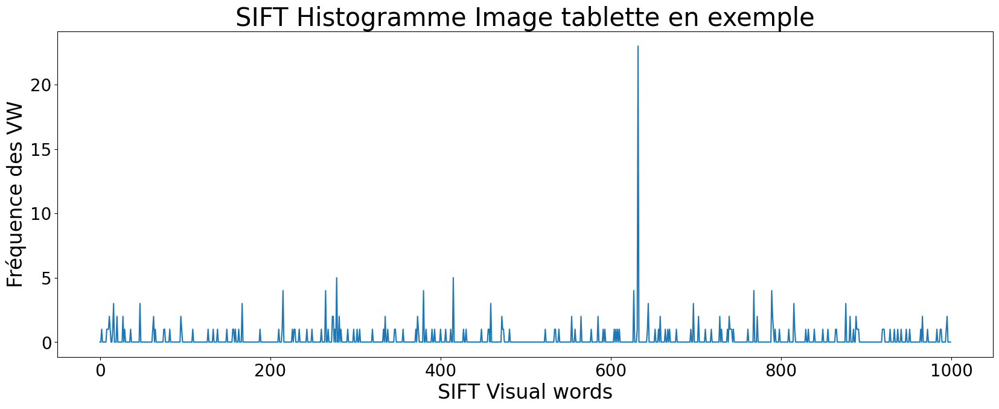

In [193]:
# Visualisation de l'histogramme pour notre image exemple
# Récupération de l'historgramme
df_visu = df_sift_bovw[df_sift_bovw['image'] ==
                       '00e966a5049a262cfc72e6bbf68b80e7.jpg']['sift_bovw']
histo_tab = df_visu.to_list()[0][0]
plt.figure(figsize=(20, 7))
plt.title('SIFT Histogramme Image tablette en exemple', fontsize=30)
plt.xlabel("SIFT Visual words", fontsize=24)
plt.ylabel("Fréquence des VW", fontsize=24)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.grid(False)
plt.plot(histo_tab)
plt.show()

In [192]:
df_visu

4    [[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0,...
Name: sift_bovw, dtype: object

**ÉTAPE 5 - Réduction de dimension des features et clustering des composantes réduites**  
- TSNe afin de réduire à 2 composantes les features 
- afficher les 2 composantes tsne en coloriant selon la catégorie réelle
- clustering kmeans à partir des deux coposantes
- afficher les 2 composantes tsne en coloriant selon le numéro de clusters Kmeans


In [24]:
l_cat = list(set(data['main_category']))
print("catégories : ", l_cat)

catégories :  ['Home Furnishing ', 'Watches ', 'Home Decor & Festive Needs ', 'Kitchen & Dining ', 'Baby Care ', 'Beauty and Personal Care ', 'Computers ']


In [33]:
#convert main_category (target) to int
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
y_cat_num = le.fit_transform(data['main_category'])
set(y_cat_num)
num_labels=len(l_cat)

In [152]:
from sklearn.metrics import accuracy_score, f1_score, classification_report
from sklearn.metrics import roc_auc_score, roc_curve, auc
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
import time
# calcul pca
from sklearn import manifold, decomposition


def reduce_pca(features, technique):
    '''reduce feature dimensionality using PCA
       parameters:
           features_init (int matrix):features to be reduced
           tehnique (string):the method used to extract features_init
       return:
           feat_pca(int matrix):reduced features  
    '''
    print(
        f"Dimensions feature {technique} avant réduction PCA : {features.shape}")
    pca = decomposition.PCA(n_components=0.95)
    # feat_pca= pca.fit_transform(cv_transform)#PCA does not support sparse input. See TruncatedSVD for a possible alternative.
    feat_pca = pca.fit_transform(features.toarray())
    # tsvd=decomposition.TruncatedSVD(n_components=2)
    #feat_tsvd= tsvd.fit_transform(cv_transform)
    #print("Dimensions TF_IDF après réduction TruncatedSVD : ", feat_tsvd.shape)

    print(f"Dimensions feature {technique} réduction PCA : {feat_pca.shape}")
    return feat_pca
# Calcul Tsne


def reduce_tsne(features, technique, per):
    '''reduce feature dimensionality using tsne (2 components)
       parameters:
           features_init (int matrix):features to be reduced
           tehnique (string):the method used to extract features_init
       return:
           feat_tsne(int matrix):reduced features  
    '''
    print(
        f"Dimensions feature {technique} avant réduction TSNE : {features.shape}")
    tsne = manifold.TSNE(n_components=2, perplexity=per, n_iter=2000,
                         init='random', learning_rate=200, random_state=42)
    feat_tsne = tsne.fit_transform(features)

    print(f"Dimensions feature {technique} réduction TSNE : {feat_tsne.shape}")
    return feat_tsne

# Calcul Tsne, détermination des clusters et calcul ARI entre vrais catégorie et n° de clusters


def ARI_fct(features, per):
    '''
    -Calcul Tsne+
    -détermination des clusters +
    -calcul ARI entre vrais catégorie et n° de clusters
    Parameters:
      features(numeric matrix): data to be reduced 
      per (int):perplexity parameter for the tsne
    returns:
      ARI (float): the ARI score between the real label and the label predicted by the kmeans (k=number of real labels)
      X_tsne (numeric matrix):reduced data
      cls.labels_ (int list): predicted label by the kmeans
    '''
    time1 = time.time()

    X_tsne = reduce_tsne(features, '', per)
    # tsne = manifold.TSNE(n_components=2, perplexity=per, n_iter=2000,
    # init='random', learning_rate=200, random_state=42)
    #X_tsne = tsne.fit_transform(features)

    # Détermination des clusters à partir des données après Tsne
    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    ARI = np.round(metrics.adjusted_rand_score(y_cat_num, cls.labels_), 4)
    time2 = np.round(time.time() - time1, 0)
    print("ARI : ", ARI, "time : ", time2, "perplexity : ", per)

    return ARI, X_tsne, cls.labels_


# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI, figsiz):
    '''visualisation du Tsne selon les vraies catégories et selon les clusters 
    Parameters:
       X_tsne(int matrix):reduced data after TSNE
       y_cat_num (int list)
       labels (int list):labels which are predicted by kmeans
       figsiz tuple of int): figure size(dim1,dim2)
    returns:
       figure
    '''
    #fig = plt.figure(figsize=(15,6))
    fig = plt.figure(figsize=figsiz)

    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y_cat_num, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[
              0], labels=l_cat, loc="best", title="Catégorie principale")
    plt.title('Représentation des produits \n par catégories principales réelles   ')

    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(
        labels), loc="best", title="Clusters")
    plt.title('Représentation des produits \n par clusters')

    plt.show()
    print("ARI : ", ARI)

 # choisir le nombre de composants pour TruncatedSVD


def select_n_components(features, goal_var):
    '''Réduire les dimensions en utilisant la méthode TruncatedSVD en respectant une variance cible.
    Parameters:
       features (int matrix):matrice de features
       goal_var(float): variance seuil
    returns:
       comp(int):nombre de dimensions optimale 

    '''
    comp = 1
    tsvd = decomposition.TruncatedSVD(n_components=comp)
    feat_tsvd = tsvd.fit_transform(cv_transform)
    variance = tsvd.explained_variance_ratio_.sum()
    while (variance < goal_var):
        comp += 1
        tsvd = decomposition.TruncatedSVD(n_components=comp)
        feat_tsvd = tsvd.fit_transform(cv_transform)
        total_variance = tsvd.explained_variance_ratio_.sum()

        #print(f"Total Explained variation by the {comp} components is {variance}")
        if (total_variance >= goal_var):
            # End the loop
            print(
                f"Total Explained variation by the {comp} components is {total_variance}")
            break

    # Return the number of components
    return comp


def pca_transform(features, technique):
    '''reduces dimensionality using pca
    parameters:
        features (int matrix):features to be reduced
        technique(string): technique used for feature extraction
    return:
        fear_pca(int matrix): reduced features
    '''
    pca = decomposition.PCA(n_components=0.95)
    print(
        f'Dimensions feature {technique} avant réduction PCA {features.shape}')
    feat_pca = pca.fit_transform(features)
    print(
        f'Dimensions feature {technique} après réduction PCA {feat_pca.shape} ')
    return feat_pca


def tsne_param(features, per):
    '''Visualision des figures pour chaque valeur de perplexity 
       Parameters:
         features (int matrix):data to reduce
         per (int list):list of perplexity values
       Returns:
         figures
    '''
    for p in per:
        try:
            ARI, X_tsne, labels = ARI_fct(features, p)
        except:
            print('erreur1')
        try:
            TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI, (10, 5))
        except:
            print('erreur2')


# creates a RF ML model


def create_RF_model(X, y, nb):
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42)
    model = RandomForestClassifier(
        n_estimators=nb, criterion='entropy', random_state=42)

    model = model.fit(X_train, y_train)
    return model, X_test, y_test


def perf_class(model, X_test, y_test):
    ''' calculate Accuracy, F1_score and print the confusion matrix and the classification report of a model
    Parameters:
     model: a  fitted and transformed classification model
     X_test:test data
     y_test:test label
     returns:
    '''

    # prediction:
    y_pred = model.predict(X_test)

    # check accuracy
    print('Accuracy: ', accuracy_score(y_test, y_pred))
    # check F_measure
    print('F_measure: ', f1_score(y_test, y_pred, average='weighted'))

    # confusion matrix
    cm = metrics.confusion_matrix(y_test, y_pred)
    # print(cm)
    # Creating a dataframe for a array-formatted Confusion matrix,so it will be easy for plotting.
    cm_df = pd.DataFrame(cm,
                         index=['0', '1', '2', '3', '4', '5', '6'],
                         columns=['0', '1', '2', '3', '4', '5', '6'])

    cm_df = pd.DataFrame(cm, index=[label for label in l_cat],
                         columns=[i for i in "0123456"])
    #plt.figure(figsize = (6,4))
    #sns.heatmap(df_cm, annot=True, cmap="Blues")
    # Plotting the confusion matrix
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm_df, annot=True)
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Values')
    plt.xlabel('Predicted Values')
    plt.show()

    # disp = metrics.plot_confusion_matrix(model, X_test, y_test,
    #                            display_labels=l_cat,
    #                            cmap=plt.cm.Blues)
    # plt.show()

    print(classification_report(y_test, y_pred))

#Pour mesurer la similarité entre les catégories et les clusters
def conf_mat_transform(y_true, y_pred):
    ''' print confusion matrix
    
    
    '''
    conf_mat = metrics.confusion_matrix(y_true, y_pred)

    # corresp = np.argmax(conf_mat, axis=0)
    corresp = [0, 1, 2, 3,4,5,6]
    print("Correspondance des clusters : ", corresp)
    # y_pred_transform = np.apply_along_axis(correspond_fct, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x: corresp[x])

    return labels['y_pred_transform']

def perf_clustering(y_true,y_predicted):
    
    conf_mat = metrics.confusion_matrix(y_true,y_predicted)
    #print(conf_mat)
    try:
        df_cmd =pd.DataFrame(conf_mat, index = [label for label in l_cat],
                  columns = [i for i in "0123456"])          
    except:
          print('err0',conf_mat)
    plt.figure(figsize = (6,4))
    sns.heatmap(df_cmd, annot=True, cmap="Blues")
    print()
    print(metrics.classification_report(y_true,y_predicted))

In [134]:
l_cat

['Home Furnishing ',
 'Watches ',
 'Home Decor & Festive Needs ',
 'Kitchen & Dining ',
 'Baby Care ',
 'Beauty and Personal Care ',
 'Computers ']

In [150]:
set(y_cat_num)

{0, 1, 2, 3, 4, 5, 6}

#### Choix du paramètre perplexity pour la tsne

TSNE (SIFT ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 1000)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0024 time :  5.0 perplexity :  5


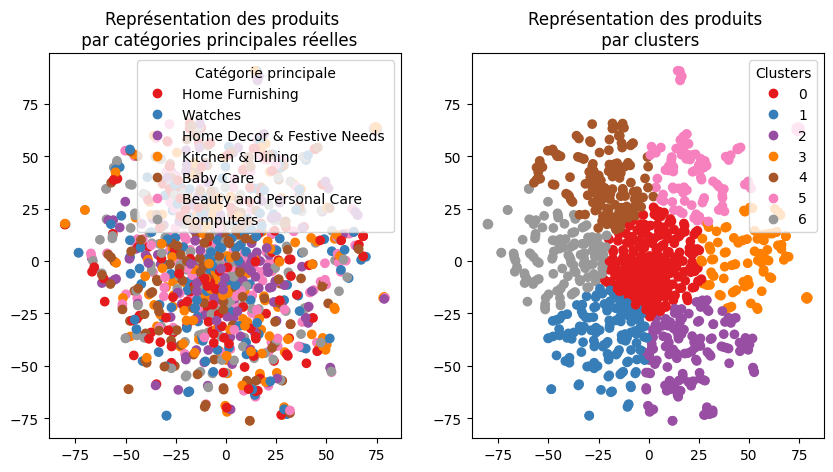

ARI :  0.0024
Dimensions feature  avant réduction TSNE : (1050, 1000)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  -0.0005 time :  5.0 perplexity :  10


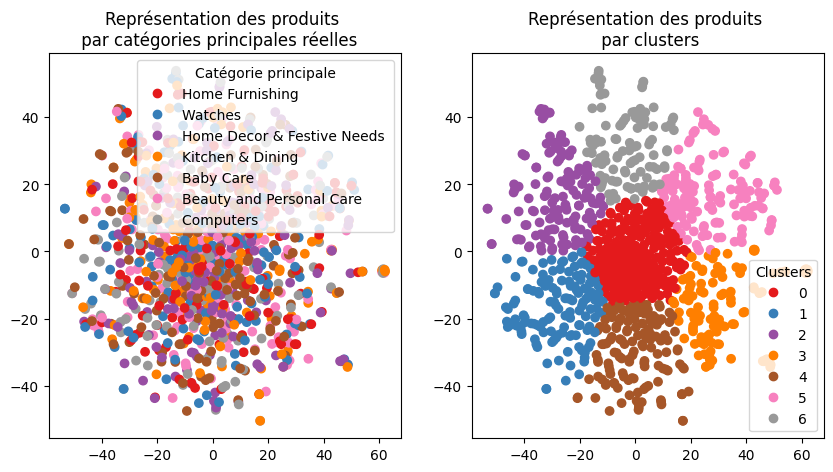

ARI :  -0.0005
Dimensions feature  avant réduction TSNE : (1050, 1000)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0004 time :  7.0 perplexity :  20


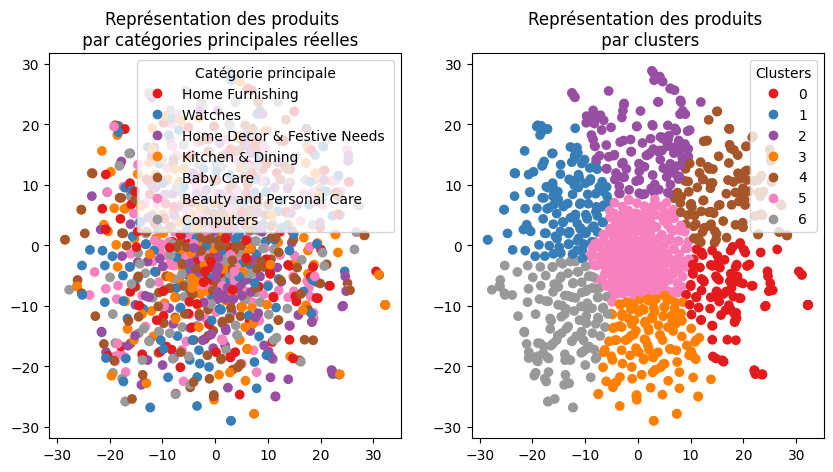

ARI :  0.0004
Dimensions feature  avant réduction TSNE : (1050, 1000)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  -0.0018 time :  8.0 perplexity :  30


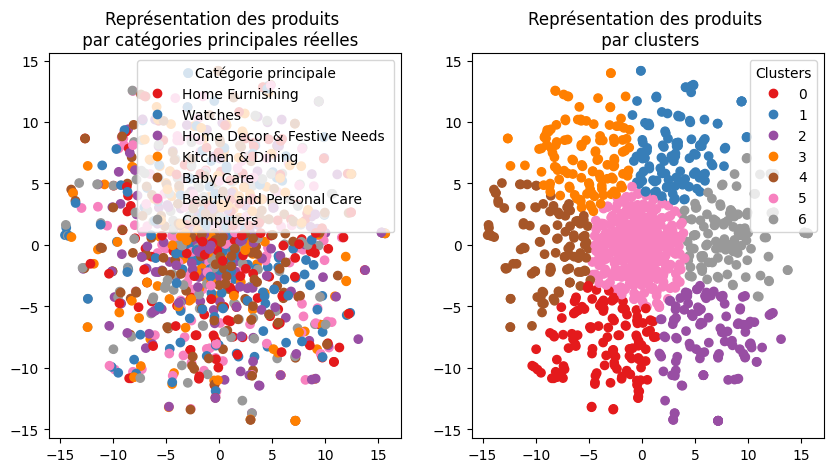

ARI :  -0.0018
Dimensions feature  avant réduction TSNE : (1050, 1000)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0032 time :  7.0 perplexity :  50


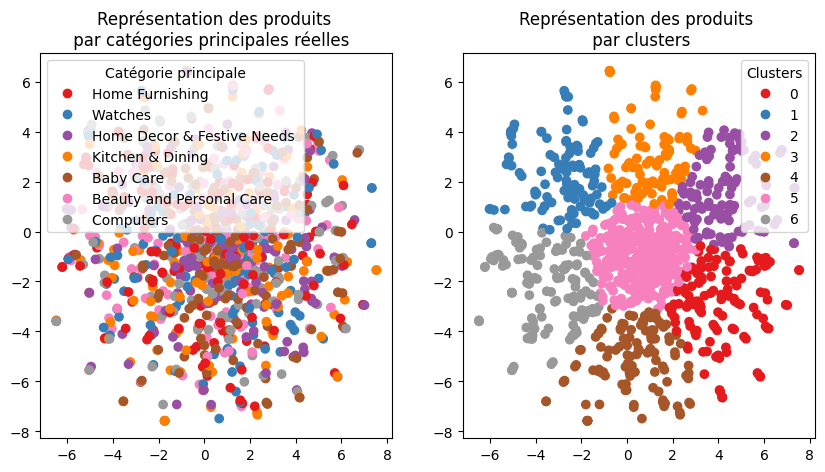

ARI :  0.0032


In [35]:
per=[5,10,20,30,50]
print("TSNE (SIFT ): ")
print("--------")
tsne_param(df_sift_vectors,per)

In [36]:
#ARI, X_tsne, labels = ARI_fct(df_sift_vectors,20)
#TSNE_visu_fct(X_tsne, y_cat_num, labels, ARI,(15,6))

In [ ]:
# from sklearn import manifold, decomposition

# print("Dimensions dataset avant réduction PCA : ", df_sift_vectors.shape)
# pca = decomposition.PCA(n_components=0.99)
# df_sift_vectors_pca= pca.fit_transform(df_sift_vectors)
# print("Dimensions dataset après réduction PCA : ", df_sift_vectors_pca.shape)

In [37]:
df_sift_vectors_pca=pca_transform(df_sift_vectors,'SIFT')

Dimensions feature SIFT avant réduction PCA (1050, 1000)
Dimensions feature SIFT après réduction PCA (1050, 296) 


TSNE sur PCA(SIFT ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 296)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0008 time :  5.0 perplexity :  5


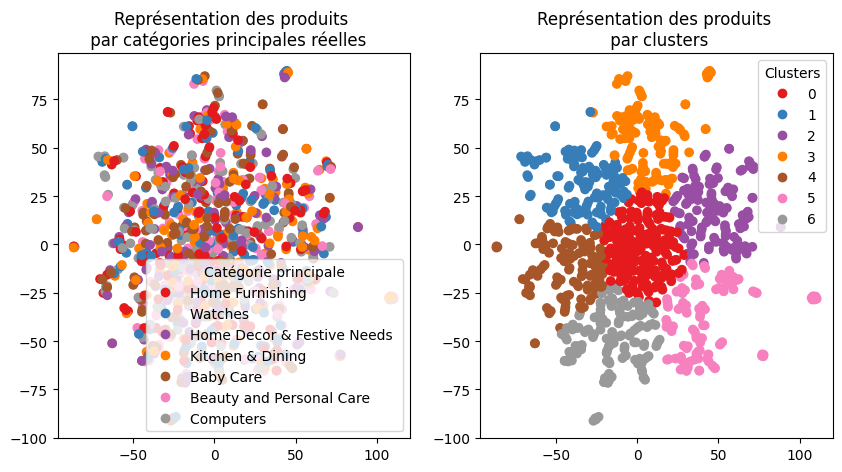

ARI :  0.0008
Dimensions feature  avant réduction TSNE : (1050, 296)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0009 time :  6.0 perplexity :  10


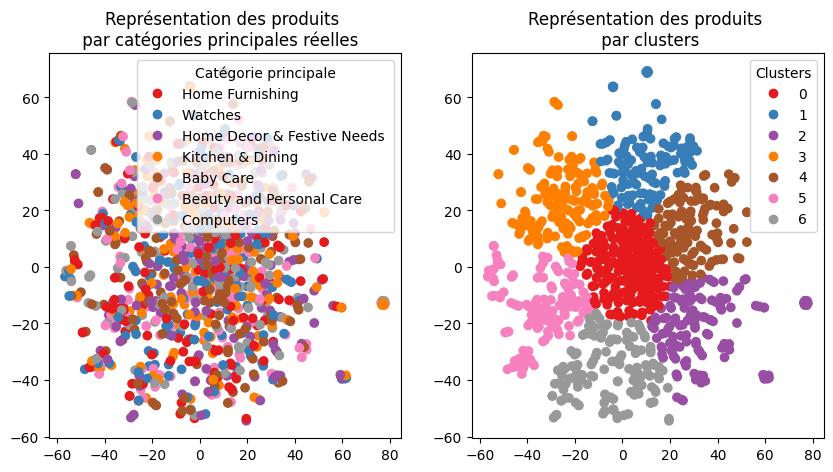

ARI :  0.0009
Dimensions feature  avant réduction TSNE : (1050, 296)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0019 time :  7.0 perplexity :  20


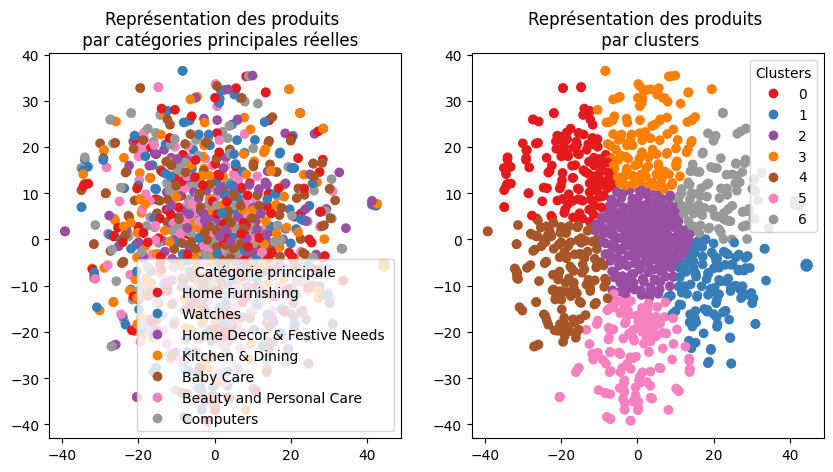

ARI :  0.0019
Dimensions feature  avant réduction TSNE : (1050, 296)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0009 time :  8.0 perplexity :  30


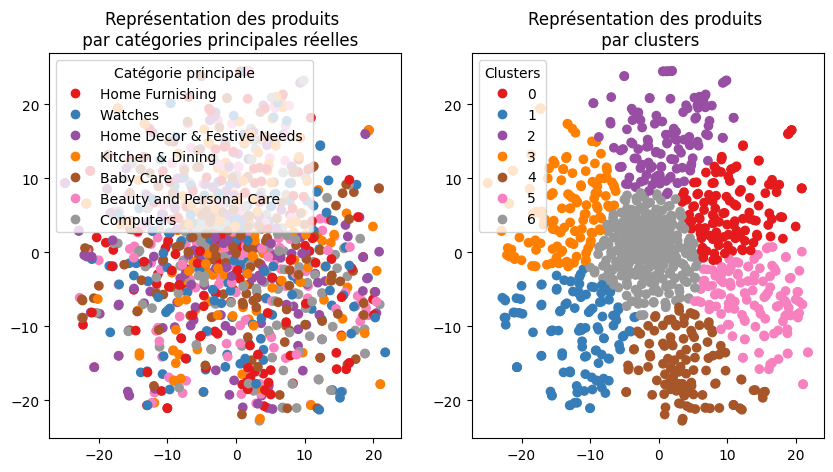

ARI :  0.0009
Dimensions feature  avant réduction TSNE : (1050, 296)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0035 time :  9.0 perplexity :  50


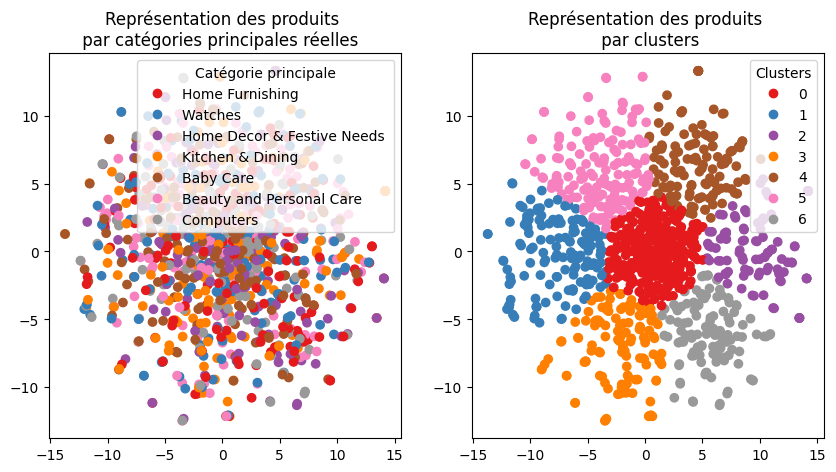

ARI :  0.0035


In [38]:
per=[5,10,20,30,50]
print("TSNE sur PCA(SIFT ): ")
print("--------")
tsne_param(df_sift_vectors_pca,per)

**Observations** :
***
- Le score ARI est faible (0.0017).
- Cette combinaison TSNE SIFT sur les images ne parvient pas à retrouver les 7 catégories comme le souhaite notre client 


##### Clustering et visualisation des clusters

In [138]:
ARI2, X_tsne2, labels2 = ARI_fct(df_sift_vectors_pca,50)

Dimensions feature  avant réduction TSNE : (1050, 296)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.0035 time :  12.0 perplexity :  50


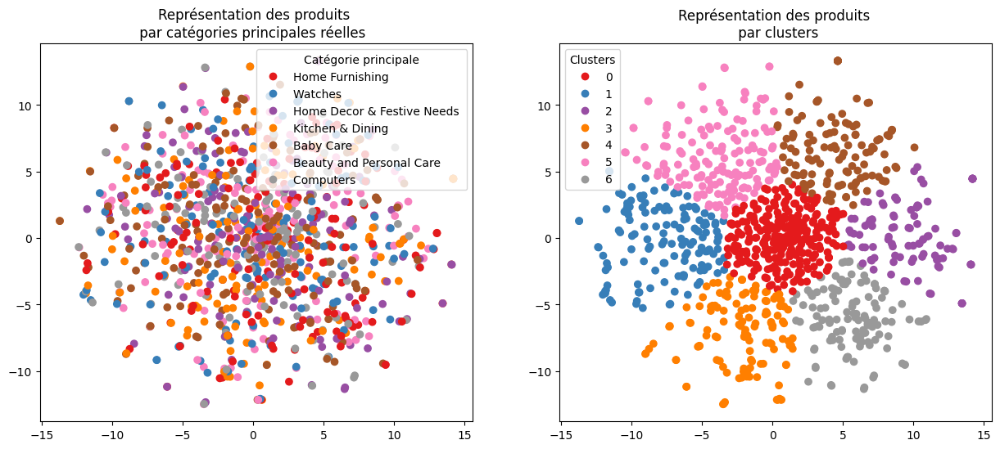

ARI :  0.0035


In [156]:
TSNE_visu_fct(X_tsne2, y_cat_num, labels2, ARI2,(15,6))

,cluster,nb_feature
0,0,140
1,1,132
2,2,250
3,3,126
4,4,144
5,5,147
6,6,111


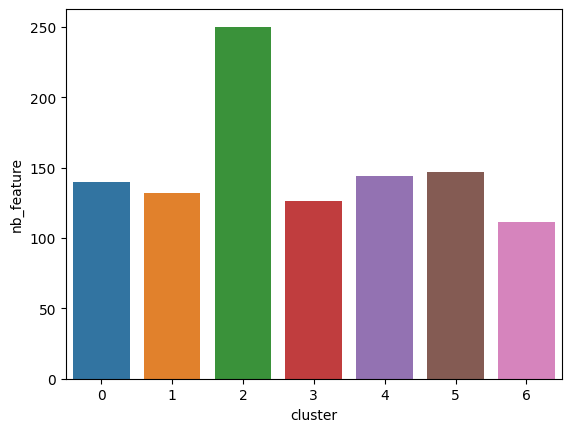

In [112]:
df=feature_cluster(X_tsne2,labels2)


##### Qualité de la catégorisation

Data reduced by pca

              precision    recall  f1-score   support

           0       0.10      0.17      0.13       150
           1       0.14      0.13      0.14       150
           2       0.14      0.09      0.11       150
           3       0.26      0.23      0.25       150
           4       0.13      0.11      0.12       150
           5       0.12      0.13      0.12       150
           6       0.15      0.12      0.13       150

    accuracy                           0.14      1050
   macro avg       0.15      0.14      0.14      1050
weighted avg       0.15      0.14      0.14      1050



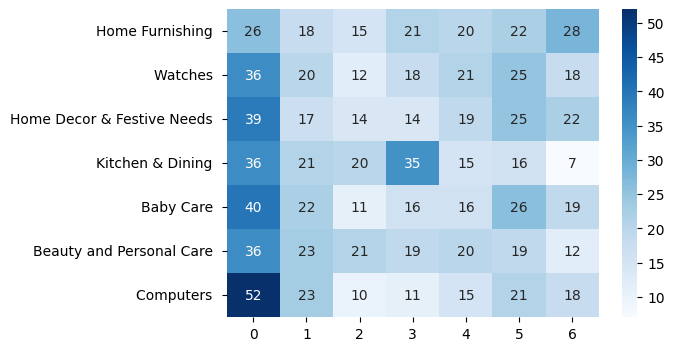

In [181]:
print("Data reduced by pca")
perf_clustering(y_cat_num, labels2)

In [160]:
labels2

array([6, 0, 2, ..., 5, 4, 4])

In [111]:
import seaborn as sns
def feature_cluster(X_tsne,labels):
    '''calculer nombre de features par cluster,affiche le resulta et son histogramme
    Prameters:
      Xtsne (int matrix with 2 columns):the reduced Xtsne features
      labels(int list):lists of cluster
    returns:
      feat_cluster(dataframe):dataframe with the cluster and the number of associeted feature
    '''
    dftsne_cl=pd.DataFrame({'tsne': X_tsne[:,0],'tsne1':X_tsne[:,1], 'cluster':labels})
    feat_cluster=pd.DataFrame(dftsne_cl.groupby('cluster')['cluster'].count()).rename(columns={'cluster':'nb_feature'}).reset_index()
  
    display(feat_cluster)
    sns.barplot(x=feat_cluster.cluster, y=feat_cluster.nb_feature)
    return feat_cluster

##### Classification supervisée

SIFT
Accuracy:  0.14285714285714285
F_measure:  0.1326333110640675


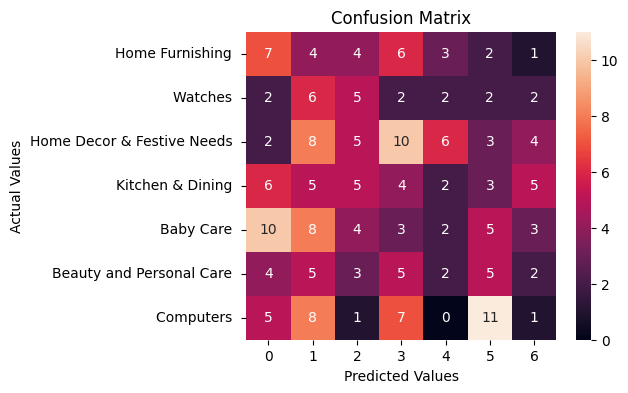

              precision    recall  f1-score   support

           0       0.19      0.26      0.22        27
           1       0.14      0.29      0.18        21
           2       0.19      0.13      0.15        38
           3       0.11      0.13      0.12        30
           4       0.12      0.06      0.08        35
           5       0.16      0.19      0.18        26
           6       0.06      0.03      0.04        33

    accuracy                           0.14       210
   macro avg       0.14      0.16      0.14       210
weighted avg       0.14      0.14      0.13       210



In [141]:
#Exécution
print('SIFT')    
model_sift, X_test_sift, y_test_sift = create_RF_model(df_sift_vectors, y_cat_num,50)
perf_class(model_sift, X_test_sift, y_test_sift)

SIFT PCA
Accuracy:  0.10952380952380952
F_measure:  0.11828369810537771


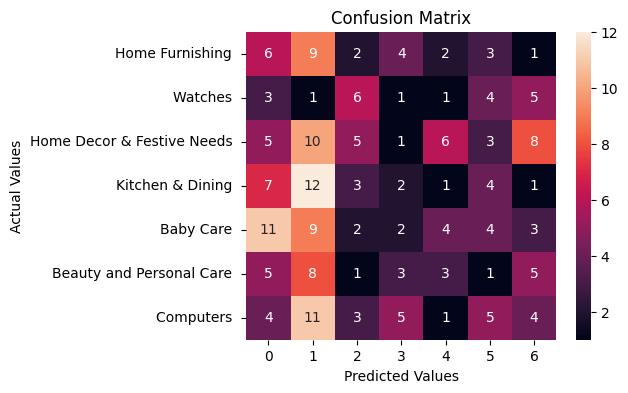

              precision    recall  f1-score   support

           0       0.15      0.22      0.18        27
           1       0.02      0.05      0.02        21
           2       0.23      0.13      0.17        38
           3       0.11      0.07      0.08        30
           4       0.22      0.11      0.15        35
           5       0.04      0.04      0.04        26
           6       0.15      0.12      0.13        33

    accuracy                           0.11       210
   macro avg       0.13      0.11      0.11       210
weighted avg       0.14      0.11      0.12       210



In [143]:

print('SIFT PCA')    
model_siftp, X_test_siftp, y_test_siftp = create_RF_model(df_sift_vectors_pca, y_cat_num,500)
perf_class(model_siftp, X_test_siftp, y_test_siftp)

# 4.Extraction des features avec Transfer learning<a class="anchor" id="tl"></a>

In [39]:
from keras.applications.efficientnet import EfficientNetB0
from keras.applications.efficientnet import preprocess_input

#### Chargement du modèle

In [40]:
# re-size all the images to this
IMAGE_SIZE = [224, 224,3]

#load model without classifier layers
effnetb0 = EfficientNetB0(input_shape=IMAGE_SIZE , weights='imagenet', include_top=False)
effnetb0.summary()

Model: "efficientnetb0"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 rescaling (Rescaling)          (None, 224, 224, 3)  0           ['input_1[0][0]']                
                                                                                                  
 normalization (Normalization)  (None, 224, 224, 3)  7           ['rescaling[0][0]']              
                                                                                                  
 rescaling_1 (Rescaling)        (None, 224, 224, 3)  0           ['normalization[0][0

 block2a_project_conv (Conv2D)  (None, 56, 56, 24)   2304        ['block2a_se_excite[0][0]']      
                                                                                                  
 block2a_project_bn (BatchNorma  (None, 56, 56, 24)  96          ['block2a_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block2b_expand_conv (Conv2D)   (None, 56, 56, 144)  3456        ['block2a_project_bn[0][0]']     
                                                                                                  
 block2b_expand_bn (BatchNormal  (None, 56, 56, 144)  576        ['block2b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block2b_e

 block3b_expand_bn (BatchNormal  (None, 28, 28, 240)  960        ['block3b_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block3b_expand_activation (Act  (None, 28, 28, 240)  0          ['block3b_expand_bn[0][0]']      
 ivation)                                                                                         
                                                                                                  
 block3b_dwconv (DepthwiseConv2  (None, 28, 28, 240)  6000       ['block3b_expand_activation[0][0]
 D)                                                              ']                               
                                                                                                  
 block3b_bn (BatchNormalization  (None, 28, 28, 240)  960        ['block3b_dwconv[0][0]']         
 )        

 D)                                                              ']                               
                                                                                                  
 block4b_bn (BatchNormalization  (None, 14, 14, 480)  1920       ['block4b_dwconv[0][0]']         
 )                                                                                                
                                                                                                  
 block4b_activation (Activation  (None, 14, 14, 480)  0          ['block4b_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block4b_se_squeeze (GlobalAver  (None, 480)         0           ['block4b_activation[0][0]']     
 agePooling2D)                                                                                    
          

 block5a_activation (Activation  (None, 14, 14, 480)  0          ['block5a_bn[0][0]']             
 )                                                                                                
                                                                                                  
 block5a_se_squeeze (GlobalAver  (None, 480)         0           ['block5a_activation[0][0]']     
 agePooling2D)                                                                                    
                                                                                                  
 block5a_se_reshape (Reshape)   (None, 1, 1, 480)    0           ['block5a_se_squeeze[0][0]']     
                                                                                                  
 block5a_se_reduce (Conv2D)     (None, 1, 1, 20)     9620        ['block5a_se_reshape[0][0]']     
                                                                                                  
 block5a_s

 block5c_se_expand (Conv2D)     (None, 1, 1, 672)    19488       ['block5c_se_reduce[0][0]']      
                                                                                                  
 block5c_se_excite (Multiply)   (None, 14, 14, 672)  0           ['block5c_activation[0][0]',     
                                                                  'block5c_se_expand[0][0]']      
                                                                                                  
 block5c_project_conv (Conv2D)  (None, 14, 14, 112)  75264       ['block5c_se_excite[0][0]']      
                                                                                                  
 block5c_project_bn (BatchNorma  (None, 14, 14, 112)  448        ['block5c_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block5c_d

 block6b_project_bn (BatchNorma  (None, 7, 7, 192)   768         ['block6b_project_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 block6b_drop (Dropout)         (None, 7, 7, 192)    0           ['block6b_project_bn[0][0]']     
                                                                                                  
 block6b_add (Add)              (None, 7, 7, 192)    0           ['block6b_drop[0][0]',           
                                                                  'block6a_project_bn[0][0]']     
                                                                                                  
 block6c_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6b_add[0][0]']            
                                                                                                  
 block6c_e

 block6d_add (Add)              (None, 7, 7, 192)    0           ['block6d_drop[0][0]',           
                                                                  'block6c_add[0][0]']            
                                                                                                  
 block7a_expand_conv (Conv2D)   (None, 7, 7, 1152)   221184      ['block6d_add[0][0]']            
                                                                                                  
 block7a_expand_bn (BatchNormal  (None, 7, 7, 1152)  4608        ['block7a_expand_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 block7a_expand_activation (Act  (None, 7, 7, 1152)  0           ['block7a_expand_bn[0][0]']      
 ivation)                                                                                         
          

#### chargement des images et extraction des features

In [45]:
effnetb0_all_features=[]
for rep_image in data['image_path']:

    # Charger l'image et la redimensionner à la taille
    # requise de 224×224 pixels.
    img = image.load_img(rep_image, target_size=(224, 224))
    # Convertir les pixels en un tableau NumPy afin de pouvoir travailler
    # avec dans Keras
    img = image.img_to_array(img)
    # Redimensionnement
    img = np.expand_dims(img, axis=0)
    # Préparer de nouvelles entrées pour le réseau.
    img = preprocess_input(img)

    # obtenir une prédiction de la probabilité d'appartenance
    # de l'image à chacun des 1000 types d'objets connus.
    effnetb0_feature = effnetb0.predict(img)
    # Ajouter la feature prédite en nparray à la liste
    effnetb0_all_features.append(np.array(effnetb0_feature).flatten())

effnetb0_all_features = np.array(effnetb0_all_features)

1/1 [==============================] - 0s 50ms/step


1/1 [==============================] - 0s 67ms/step


1/1 [==============================] - 0s 66ms/step


1/1 [==============================] - 0s 59ms/step


1/1 [==============================] - 0s 56ms/step


C:\Users\imen2\anaconda3\envs\oc_env\lib\site-packages\PIL\Image.py:3035: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


1/1 [==============================] - 0s 61ms/step


1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 66ms/step


In [46]:
# Dataframe de sauvegarde des BOVW effin0
# Association des features à chaque image
data['effnetb0_bovw'] = [effnetb0_all_features[i] for i in range(data.shape[0])]
# Dataframe de travail
df_effnetb0_bovw = data[['image', 'image_path', 'main_category', 'effnetb0_bovw']]
# Constituer le dataframe de vecteurs de BOVW effin0
df_effnetb0_vectors = pd.DataFrame.from_records(effnetb0_all_features)

In [48]:
# Sauvegarde du dataframe des vectors BOVW VGG19
with open('sauvegarde/df_effnetb0_vectors.pickle', 'wb') as f:
    pickle.dump(df_effnetb0_vectors, f, pickle.HIGHEST_PROTOCOL)

#### choix du paramètre de perplexité pour la tsne

TSNE (Efficientnetb0 ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 62720)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2707 time :  9.0 perplexity :  5


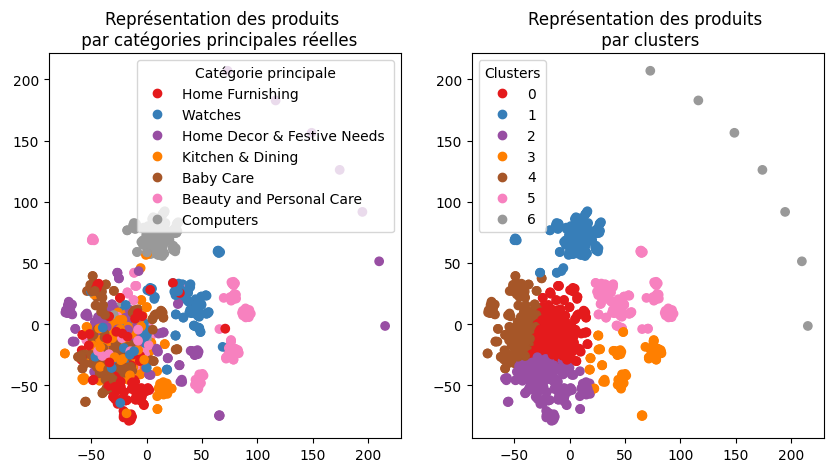

ARI :  0.2707
Dimensions feature  avant réduction TSNE : (1050, 62720)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3769 time :  11.0 perplexity :  10


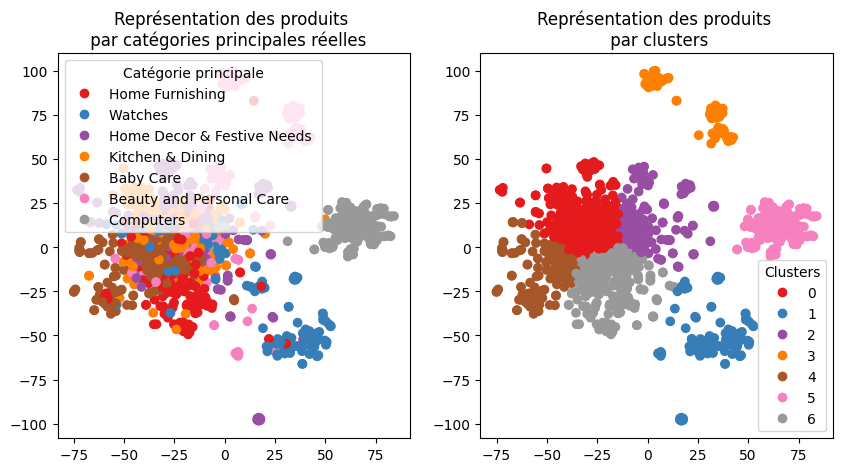

ARI :  0.3769
Dimensions feature  avant réduction TSNE : (1050, 62720)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3616 time :  10.0 perplexity :  20


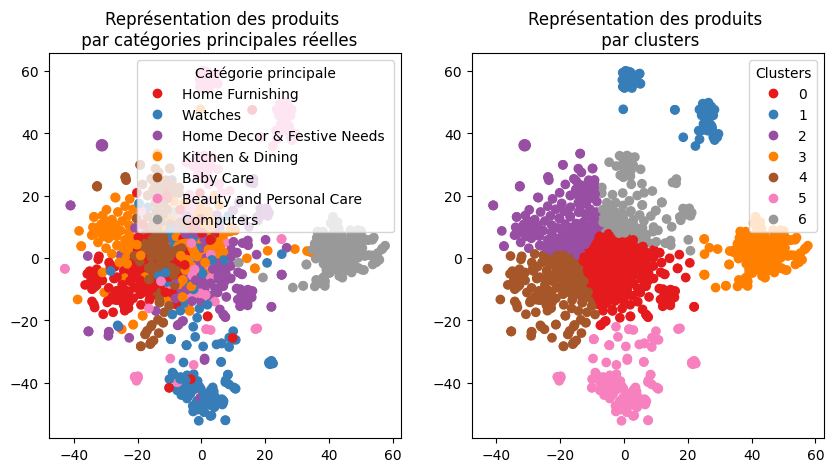

ARI :  0.3616
Dimensions feature  avant réduction TSNE : (1050, 62720)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3596 time :  10.0 perplexity :  30


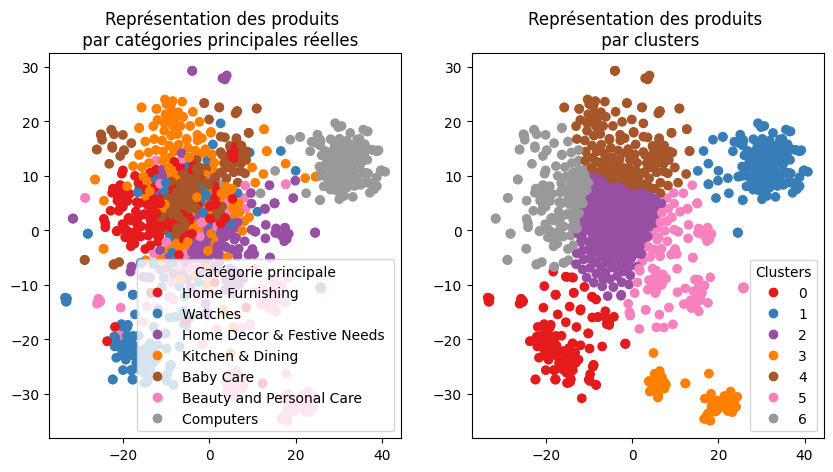

ARI :  0.3596
Dimensions feature  avant réduction TSNE : (1050, 62720)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.349 time :  13.0 perplexity :  50


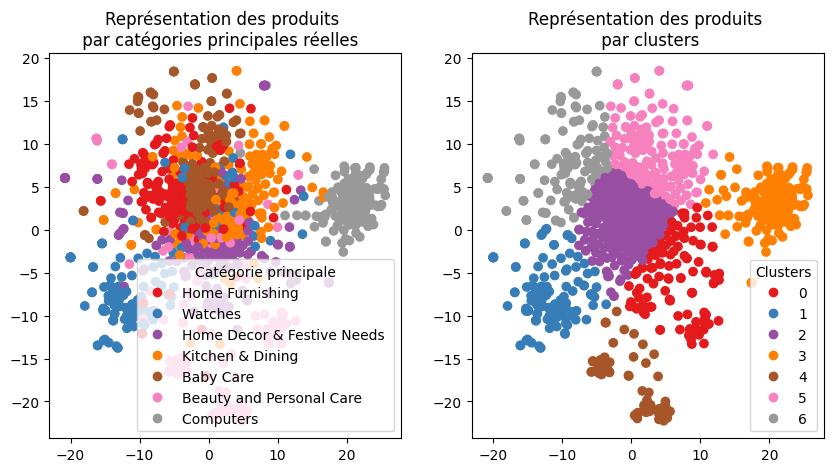

ARI :  0.349


In [49]:
per=[5,10,20,30,50]
print("TSNE (Efficientnetb0 ): ")
print("--------")
tsne_param(df_effnetb0_vectors,per)

#### Clustering et visualisation des clusters

Dimensions feature  avant réduction TSNE : (1050, 62720)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3769 time :  13.0 perplexity :  10


,cluster,nb_feature
0,0,247
1,1,123
2,2,124
3,3,78
4,4,119
5,5,148
6,6,211


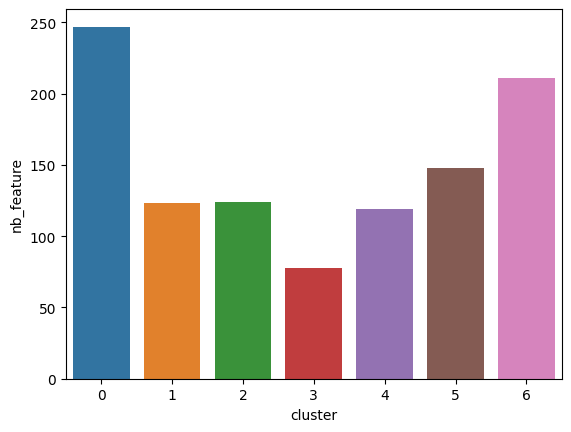

In [144]:
ARI3, X_tsne3, labels3 = ARI_fct(df_effnetb0_vectors,10)
df3=feature_cluster(X_tsne3,labels3)

Dimensions feature  avant réduction TSNE : (1050, 62720)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3769 time :  9.0 perplexity :  10


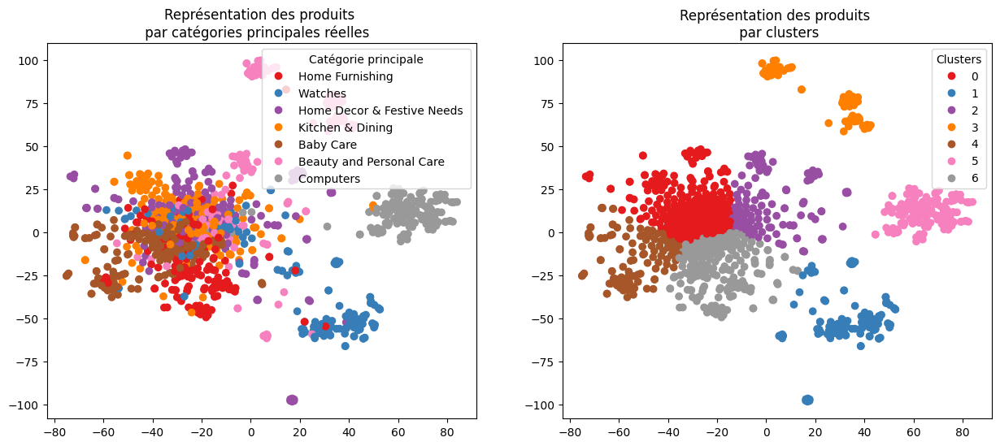

ARI :  0.3769


In [107]:

TSNE_visu_fct(X_tsne3, y_cat_num, labels3, ARI3,(15,6))

#### Classification supervisée

Efficientnetb0
Accuracy:  0.8476190476190476
F_measure:  0.848576699114798


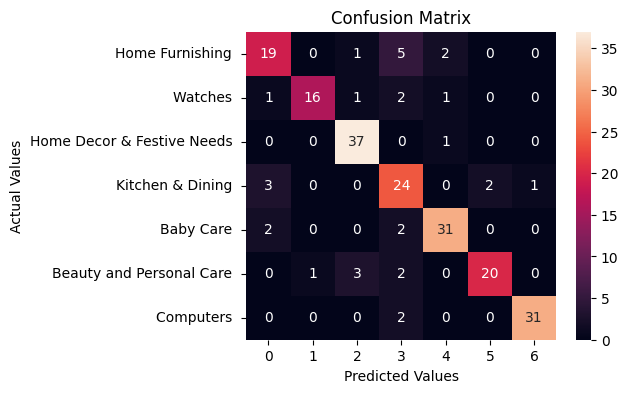

              precision    recall  f1-score   support

           0       0.76      0.70      0.73        27
           1       0.94      0.76      0.84        21
           2       0.88      0.97      0.93        38
           3       0.65      0.80      0.72        30
           4       0.89      0.89      0.89        35
           5       0.91      0.77      0.83        26
           6       0.97      0.94      0.95        33

    accuracy                           0.85       210
   macro avg       0.86      0.83      0.84       210
weighted avg       0.86      0.85      0.85       210



In [137]:
#Exécution
print('Efficientnetb0')    
model_b, X_test_b, y_test_b = create_RF_model(df_effnetb0_vectors, y_cat_num,500)
perf_class(model_b, X_test_b, y_test_b )

#### Réduction des features avec pca

In [50]:
df_effnetb0_vectors_pca=pca_transform(df_effnetb0_vectors,'effnetb0')

Dimensions feature effnetb0 avant réduction PCA (1050, 62720)
Dimensions feature effnetb0 après réduction PCA (1050, 784) 


##### Choiw de la perplexité 

TSNE (Efficientnetb0 PCA ): 
--------
Dimensions feature  avant réduction TSNE : (1050, 784)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2979 time :  5.0 perplexity :  5


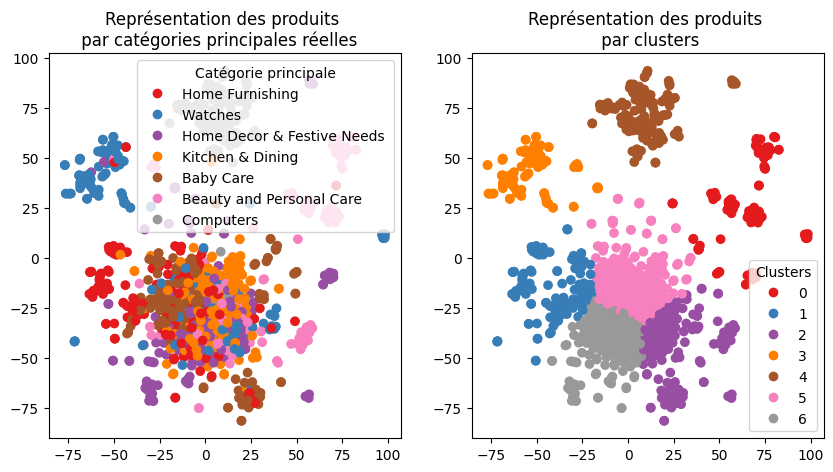

ARI :  0.2979
Dimensions feature  avant réduction TSNE : (1050, 784)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.2783 time :  6.0 perplexity :  10


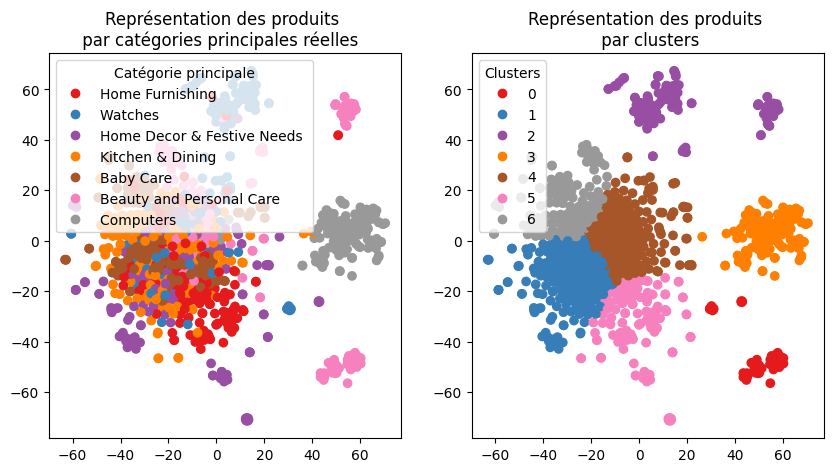

ARI :  0.2783
Dimensions feature  avant réduction TSNE : (1050, 784)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3407 time :  7.0 perplexity :  20


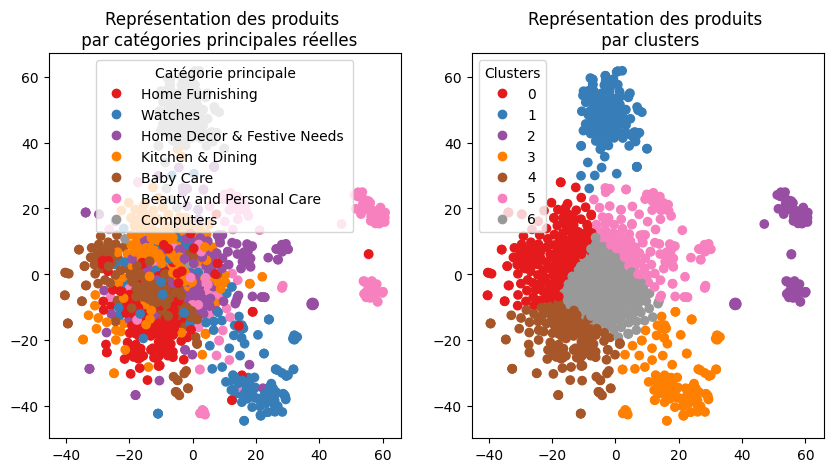

ARI :  0.3407
Dimensions feature  avant réduction TSNE : (1050, 784)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3521 time :  8.0 perplexity :  30


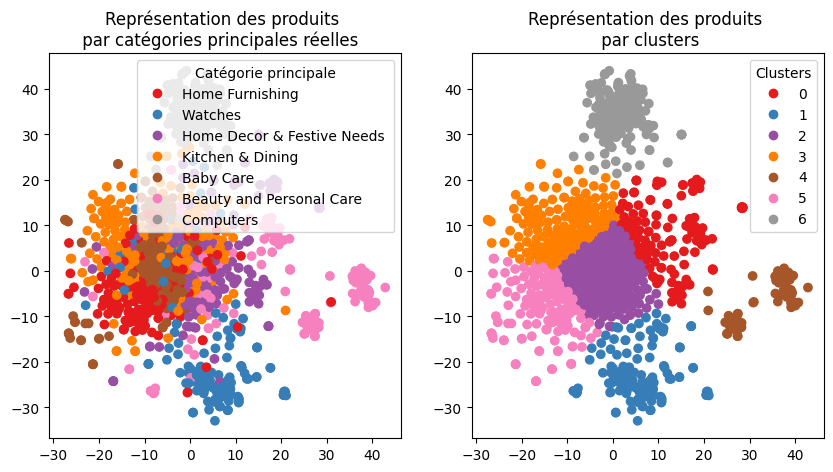

ARI :  0.3521
Dimensions feature  avant réduction TSNE : (1050, 784)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3483 time :  9.0 perplexity :  50


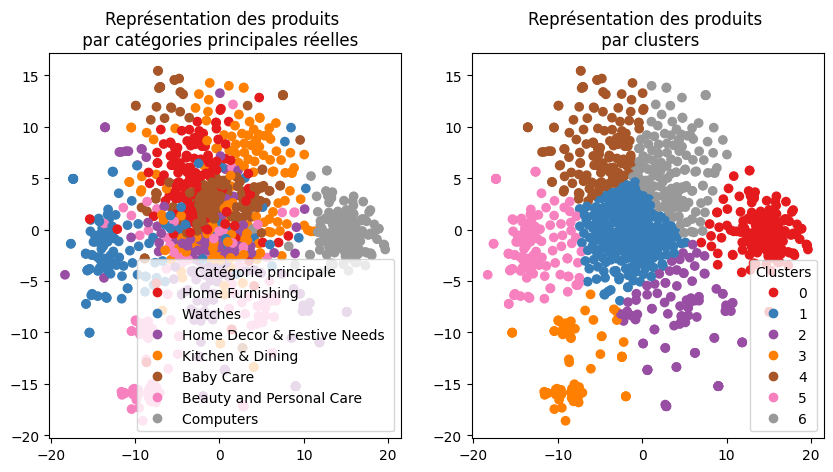

ARI :  0.3483


In [51]:
per=[5,10,20,30,50]
print("TSNE (Efficientnetb0 PCA ): ")
print("--------")
tsne_param(df_effnetb0_vectors_pca,per)

##### Clustering et visualisation des clusters

Dimensions feature  avant réduction TSNE : (1050, 784)
Dimensions feature  réduction TSNE : (1050, 2)
ARI :  0.3521 time :  11.0 perplexity :  30


,cluster,nb_feature
0,0,127
1,1,142
2,2,234
3,3,154
4,4,80
5,5,149
6,6,164


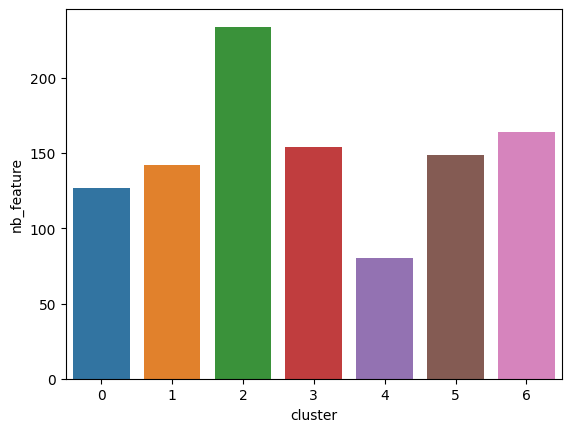

In [145]:
ARI4, X_tsne4, labels4 = ARI_fct(df_effnetb0_vectors_pca,30)
df4=feature_cluster(X_tsne4,labels4)

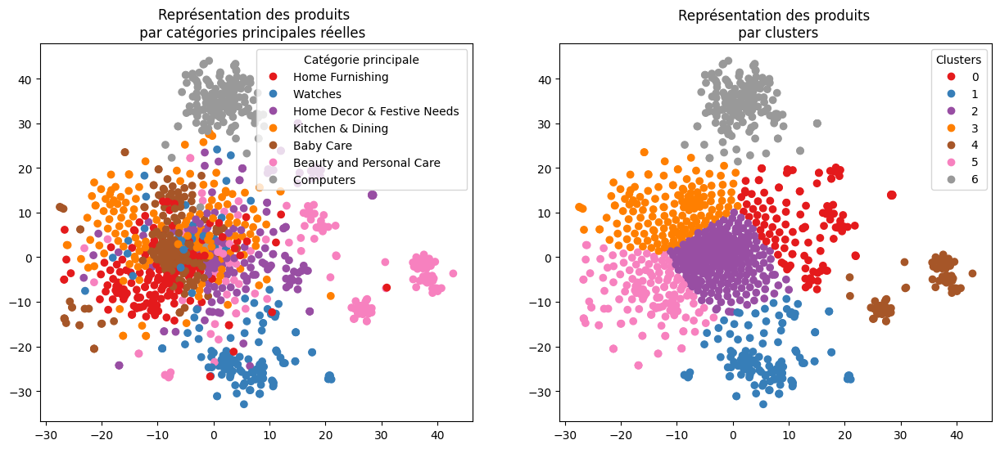

ARI :  0.3521


In [146]:

TSNE_visu_fct(X_tsne4, y_cat_num, labels4, ARI4,(15,6))

##### Qualité de la catégorisation

features reduced by pca

              precision    recall  f1-score   support

           0       0.03      0.03      0.03       150
           1       0.81      0.77      0.79       150
           2       0.21      0.33      0.26       150
           3       0.41      0.42      0.41       150
           4       0.00      0.00      0.00       150
           5       0.03      0.03      0.03       150
           6       0.90      0.98      0.94       150

    accuracy                           0.36      1050
   macro avg       0.34      0.36      0.35      1050
weighted avg       0.34      0.36      0.35      1050



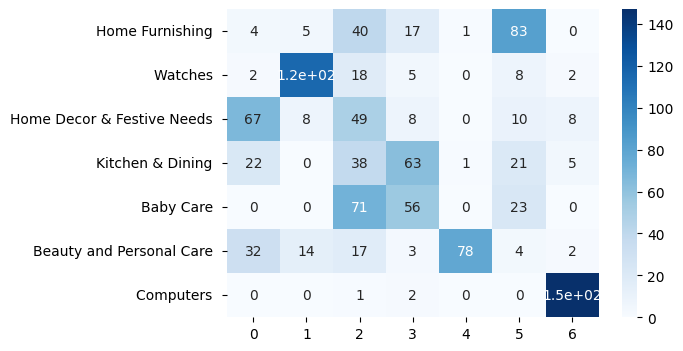

In [182]:
print("features reduced by pca")
perf_clustering(y_cat_num, labels4)

##### Classification supervisée

Efficientnetb0 (PCA)
Accuracy:  0.8095238095238095
F_measure:  0.8074048300014909


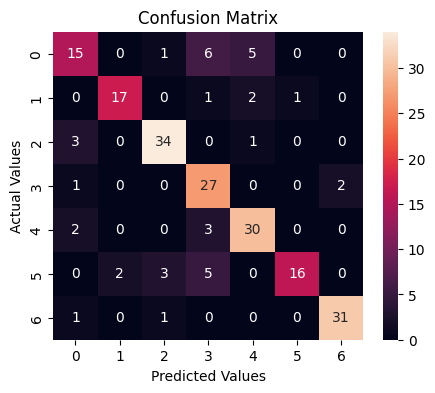

              precision    recall  f1-score   support

           0       0.68      0.56      0.61        27
           1       0.89      0.81      0.85        21
           2       0.87      0.89      0.88        38
           3       0.64      0.90      0.75        30
           4       0.79      0.86      0.82        35
           5       0.94      0.62      0.74        26
           6       0.94      0.94      0.94        33

    accuracy                           0.81       210
   macro avg       0.82      0.80      0.80       210
weighted avg       0.82      0.81      0.81       210



In [133]:
#Exécution
print('Efficientnetb0 (PCA)')    
model_p, X_test_p, y_test_p = create_RF_model(df_effnetb0_vectors_pca, y_cat_num,900)
perf_class(model_p, X_test_p, y_test_p )

## Fine tuning Fine-tune  on a new set of classes